# Dynamic Test Analysis
## Voltage vs Time

In [1]:
import pandas as pd
import glob

# Read all CSV files in the current directory
csv_files = glob.glob('*.csv')

# Read each CSV file and store in a dictionary
dataframes = {file: pd.read_csv(file) for file in csv_files}

# Display the first dataframe to see available columns
print(dataframes['900.csv'].head())
print(dataframes['900.csv'].columns)

   Time sec  Volt CH 1   Volt  Volt CH 2  Current     Power    RF    RR    LF  \
0      0.00       5.22  25.58   0.000092     0.12  3.122331  68.4  70.6  68.3   
1      0.03       5.22  25.59   0.000061     0.08  2.082773  68.3  70.7  68.3   
2      0.06       5.22  25.59   0.000076     0.10  2.602705  68.4  70.7  68.3   
3      0.09       5.22  25.57   0.000046     0.06  1.560713  68.5  70.7  68.3   
4      0.12       5.22  25.60   0.000092     0.12  3.125071  68.5  70.8  68.3   

     LR  CPM  MPH  
0  66.0  0.0  0.0  
1  66.0  0.0  0.0  
2  66.0  0.0  0.0  
3  66.0  0.0  0.0  
4  66.0  0.0  0.0  
Index(['Time sec', 'Volt CH 1', 'Volt', 'Volt CH 2', 'Current', 'Power', 'RF',
       'RR', 'LF', 'LR', 'CPM', 'MPH'],
      dtype='str')


In [2]:
df_900 = dataframes['900.csv']
df_1200 = dataframes['1200.csv']
df_1500 = dataframes['1500.csv']
df_2000 = dataframes['2000.csv']

In [3]:
print(df_2000["Time sec"])  # Print the "Time sec" column of the 2000.csv dataframe

0          0.00
1          0.03
2          0.06
3          0.09
4          0.12
          ...  
25591    767.73
25592    767.76
25593    767.79
25594    767.82
25595    767.85
Name: Time sec, Length: 25596, dtype: float64


In [4]:
volt_column = next(col for col in df_2000.columns if col.strip().lower() == 'volt')

# Create DataFrames with time and voltage
dfs_with_time = []
for suffix, df in [('900', df_900), ('1200', df_1200), ('1500', df_1500), ('2000', df_2000)]:
    temp_df = df[['Time sec', volt_column]].copy()
    temp_df.rename(columns={volt_column: f'voltage_{suffix}'}, inplace=True)
    dfs_with_time.append(temp_df)

# Merge all on 'Time sec' using outer join
voltage_vs_time = dfs_with_time[0]
for df in dfs_with_time[1:]:
    voltage_vs_time = pd.merge(voltage_vs_time, df, on='Time sec', how='outer')

# Sort by time
voltage_vs_time = voltage_vs_time.sort_values('Time sec').reset_index(drop=True)

# Interpolate missing values
voltage_vs_time = voltage_vs_time.interpolate(method='linear')

In [5]:
print(voltage_vs_time.head(20))

    Time sec  voltage_900  voltage_1200  voltage_1500  voltage_2000
0       0.00        25.58         25.44         25.50         25.06
1       0.03        25.59         25.41         25.50         25.08
2       0.06        25.59         25.41         25.49         25.05
3       0.09        25.57         25.40         25.50         25.08
4       0.12        25.60         25.41         25.47         25.08
5       0.15        25.59         25.42         25.49         25.06
6       0.18        25.59         25.41         25.50         25.05
7       0.21        25.59         25.41         25.49         25.07
8       0.24        25.59         25.41         25.48         25.07
9       0.27        25.60         25.41         25.50         25.08
10      0.30        25.59         25.41         25.51         25.08
11      0.33        25.59         25.41         25.50         25.07
12      0.36        25.58         25.42         25.49         25.08
13      0.39        25.58         25.40         

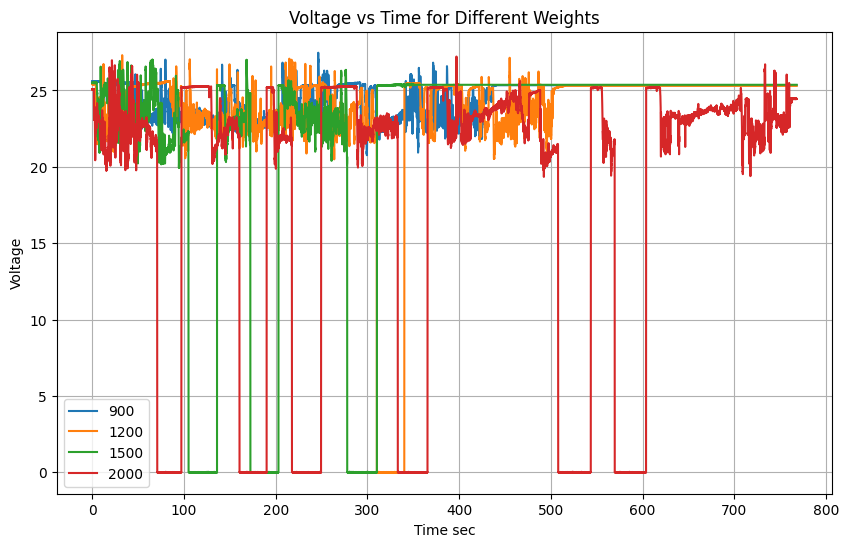

In [6]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))

for col in ['voltage_900', 'voltage_1200', 'voltage_1500', 'voltage_2000']:
    plt.plot(voltage_vs_time['Time sec'], voltage_vs_time[col], label=col.replace('voltage_', ''))

plt.xlabel('Time sec')
plt.ylabel('Voltage')
plt.title('Voltage vs Time for Different Weights')
plt.legend()
plt.grid(True)
plt.show()

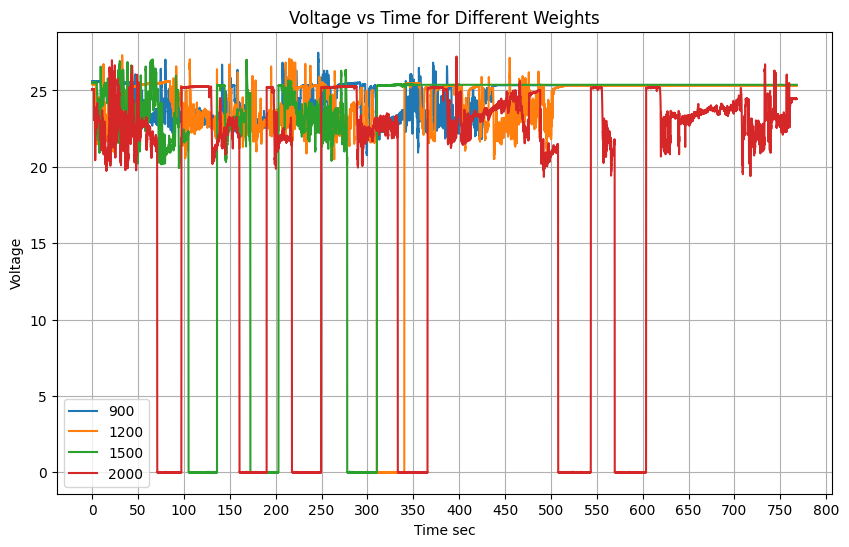

Plot saved as 'voltage_vs_time_plot.png'


<Figure size 640x480 with 0 Axes>

In [ ]:
%matplotlib inline
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))

for col in ['voltage_900', 'voltage_1200', 'voltage_1500', 'voltage_2000']:
    plt.plot(voltage_vs_time['Time sec'], voltage_vs_time[col], label=col.replace('voltage_', ''))

plt.xlabel('Time sec')
plt.ylabel('Voltage')
plt.title('Voltage vs Time for Different Weights')
plt.legend()
plt.grid(True)
plt.xticks(range(0, int(voltage_vs_time['Time sec'].max()) + 50, 50))
plt.show()

# Save the plot to file
plt.savefig('voltage_vs_time_plot.png')
print("Plot saved as 'voltage_vs_time_plot.png'")

In [43]:
import plotly.graph_objects as go

fig = go.Figure()

colors = ['blue', 'green', 'orange', 'red']  # Distinct colors for each line

for i, col in enumerate(['voltage_900', 'voltage_1200', 'voltage_1500', 'voltage_2000']):
    fig.add_trace(go.Scatter(
        x=voltage_vs_time['Time sec'],
        y=voltage_vs_time[col],
        mode='lines',
        name=col.replace('voltage_', ''),
        line=dict(color=colors[i])
    ))

fig.update_layout(
    title='Voltage vs Time for Different Weights',
    xaxis_title='Time sec',
    yaxis_title='Voltage',
    hovermode='x unified',
    width=1200,
    height=800,

    xaxis=dict(
        tickvals=list(range(0, int(voltage_vs_time['Time sec'].max()) + 50, 50))
    ),
    autosize=True
)

fig.show(config={'responsive': True})
fig.write_html("voltage_vs_time_chart.html")



## Current vs Time

In [22]:
print(df_2000.columns)

Index(['Time sec', 'Volt CH 1', 'Volt', 'Volt CH 2', 'Current', 'Power', 'RF',
       'RR', 'LF', 'LR', 'CPM', 'MPH'],
      dtype='str')


In [23]:
# 
current_column = next(col for col in df_2000.columns if col.strip().lower() == 'current')

# Create DataFrames with time and voltage
dfs_with_time = []
for suffix, df in [('900', df_900), ('1200', df_1200), ('1500', df_1500), ('2000', df_2000)]:
    temp_df = df[['Time sec', current_column]].copy()
    temp_df.rename(columns={current_column: f'current_{suffix}'}, inplace=True)
    dfs_with_time.append(temp_df)

# Merge all on 'Time sec' using outer join
current_column_vs_time = dfs_with_time[0]
for df in dfs_with_time[1:]:
    current_column_vs_time = pd.merge(current_column_vs_time, df, on='Time sec', how='outer')

# Sort by time
current_vs_time = current_column_vs_time.sort_values('Time sec').reset_index(drop=True)

# Interpolate missing values
current_vs_time = current_vs_time.interpolate(method='linear')

In [24]:
print(current_vs_time.head(20))

    Time sec  current_900  current_1200  current_1500  current_2000
0       0.00         0.12          0.24          0.53          0.45
1       0.03         0.08          0.20          0.04          0.28
2       0.06         0.10         -0.04          0.45          0.16
3       0.09         0.06         -0.04         -0.12          0.37
4       0.12         0.12          0.28          0.04          0.45
5       0.15         0.10          0.16         -0.08          0.16
6       0.18         0.06          0.16          0.49          0.45
7       0.21         0.06          0.37          0.00          0.00
8       0.24         0.08          0.16          0.16          0.33
9       0.27         0.10          0.04          0.45          0.24
10      0.30         0.10          0.04          0.33          0.33
11      0.33         0.06          0.16          0.24          0.28
12      0.36         0.14          0.37          0.24          0.37
13      0.39         0.08          0.08         

In [42]:
import plotly.graph_objects as go

fig = go.Figure()

colors = ['blue', 'orange', 'green', 'purple']  # Distinct colors for each line

for i, col in enumerate(['current_900', 'current_1200', 'current_1500', 'current_2000']):
    fig.add_trace(go.Scatter(
        x=current_vs_time['Time sec'],
        y=current_vs_time[col],
        mode='lines',
        name=col.replace('current_', ''),
        line=dict(color=colors[i])
    ))

fig.update_layout(
    title='Current vs Time for Different Weights',
    xaxis_title='Time sec',
    yaxis_title='Current',
    hovermode='x unified',
    width=1200,
    height=800,
    
    xaxis=dict(
        tickvals=list(range(0, int(current_vs_time['Time sec'].max()) + 50, 50))
    ),
    autosize=True
)

fig.show(config={'responsive': True})
fig.write_html("current_vs_time_chart.html")


## Power vs Time

In [52]:
# 
power_column = next(col for col in df_2000.columns if col.strip().lower() == 'power')

# Create DataFrames with time and voltage
dfs_with_time = []
for suffix, df in [('900', df_900), ('1200', df_1200), ('1500', df_1500), ('2000', df_2000)]:
    temp_df = df[['Time sec', power_column]].copy()
    temp_df.rename(columns={power_column: f'power_{suffix}'}, inplace=True)
    dfs_with_time.append(temp_df)

# Merge all on 'Time sec' using outer join
power_column_vs_time = dfs_with_time[0]
for df in dfs_with_time[1:]:
    power_column_vs_time = pd.merge(power_column_vs_time, df, on='Time sec', how='outer')

# Sort by time
power_vs_time = power_column_vs_time.sort_values('Time sec').reset_index(drop=True)

# Interpolate missing values
power_vs_time = power_vs_time.interpolate(method='linear')

In [53]:
print(power_vs_time.head())

   Time sec  power_900  power_1200  power_1500  power_2000
0      0.00   3.122331        6.21       13.49       11.22
1      0.03   2.082773        5.17        1.04        7.14
2      0.06   2.602705       -1.03       11.41        4.08
3      0.09   1.560713       -1.03       -3.11        9.19
4      0.12   3.125071        7.24        1.04       11.22


In [54]:
import plotly.graph_objects as go

fig = go.Figure()

colors = ['blue', 'orange', 'green', 'purple']  # Distinct colors for each line

for i, col in enumerate(['power_900', 'power_1200', 'power_1500', 'power_2000']):
    fig.add_trace(go.Scatter(
        x=power_vs_time['Time sec'],
        y=power_vs_time[col],
        mode='lines',
        name=col.replace('power_', ''),
        line=dict(color=colors[i])
    ))

fig.update_layout(
    title='Power vs Time for Different Weights',
    xaxis_title='Time sec',
    yaxis_title='power',
    hovermode='x unified',
    width=1200,
    height=800,
    
    xaxis=dict(
        tickvals=list(range(0, int(power_vs_time['Time sec'].max()) + 50, 50))
    ),
    autosize=True
)

fig.show(config={'responsive': True})
fig.write_html("power_vs_time_chart.html")


## Speed vs Time 

In [31]:
# 
mph_column = next(col for col in df_2000.columns if col.strip().lower() == 'mph')

# Create DataFrames with time and voltage
dfs_with_time = []
for suffix, df in [('900', df_900), ('1200', df_1200), ('1500', df_1500), ('2000', df_2000)]:
    temp_df = df[['Time sec', mph_column]].copy()
    temp_df.rename(columns={mph_column: f'mph_{suffix}'}, inplace=True)
    dfs_with_time.append(temp_df)

# Merge all on 'Time sec' using outer join
mph_column_vs_time = dfs_with_time[0]
for df in dfs_with_time[1:]:
    mph_column_vs_time = pd.merge(mph_column_vs_time, df, on='Time sec', how='outer')

# Sort by time
mph_vs_time = mph_column_vs_time.sort_values('Time sec').reset_index(drop=True)

# Interpolate missing values
mph_vs_time = mph_vs_time.interpolate(method='linear')

In [33]:
print(mph_vs_time.head(200))

     Time sec  mph_900  mph_1200  mph_1500  mph_2000
0        0.00      0.0       0.0       0.0      0.00
1        0.03      0.0       0.0       0.0      0.00
2        0.06      0.0       0.0       0.0      0.00
3        0.09      0.0       0.0       0.0      0.00
4        0.12      0.0       0.0       0.0      0.00
..        ...      ...       ...       ...       ...
195      5.85      0.0       0.0       0.0      3.55
196      5.88      0.0       0.0       0.0      3.55
197      5.91      0.0       0.0       0.0      3.55
198      5.94      0.0       0.0       0.0      3.55
199      5.97      0.0       0.0       0.0      3.55

[200 rows x 5 columns]


In [44]:
import plotly.graph_objects as go

fig = go.Figure()

colors = ['blue', 'orange', 'green', 'purple']  # Distinct colors for each line

for i, col in enumerate(['mph_900', 'mph_1200', 'mph_1500', 'mph_2000']):
    fig.add_trace(go.Scatter(
        x=mph_vs_time['Time sec'],
        y=mph_vs_time[col],
        mode='lines',
        name=col.replace('mph_', ''),
        line=dict(color=colors[i])
    ))

fig.update_layout(
    title='MPH vs Time for Different Weights',
    xaxis_title='Time sec',
    yaxis_title='MPH',
    hovermode='x unified',
    width=1200,
    height=800,
    
    xaxis=dict(
        tickvals=list(range(0, int(mph_vs_time['Time sec'].max()) + 50, 50))
    ),
    autosize=True
)

fig.show(config={'responsive': True})
fig.write_html("mph_vs_time_chart.html")



## Temperature vs Time

### 900 lb

In [35]:
print(df_900.head())


   Time sec  Volt CH 1   Volt  Volt CH 2  Current     Power    RF    RR    LF  \
0      0.00       5.22  25.58   0.000092     0.12  3.122331  68.4  70.6  68.3   
1      0.03       5.22  25.59   0.000061     0.08  2.082773  68.3  70.7  68.3   
2      0.06       5.22  25.59   0.000076     0.10  2.602705  68.4  70.7  68.3   
3      0.09       5.22  25.57   0.000046     0.06  1.560713  68.5  70.7  68.3   
4      0.12       5.22  25.60   0.000092     0.12  3.125071  68.5  70.8  68.3   

     LR  CPM  MPH  
0  66.0  0.0  0.0  
1  66.0  0.0  0.0  
2  66.0  0.0  0.0  
3  66.0  0.0  0.0  
4  66.0  0.0  0.0  


In [45]:
import plotly.graph_objects as go

fig = go.Figure()

colors = ['blue', 'orange', 'green', 'purple']  # Distinct colors for each line

for i, col in enumerate(['RF', 'RR', 'LF', 'LR']):
    fig.add_trace(go.Scatter(
        x=df_900['Time sec'],
        y=df_900[col],
        mode='lines',
        name=col,
        line=dict(color=colors[i])
    ))

fig.update_layout(
    title='Temperature vs Time for 900 lb',
    xaxis_title='Time sec',
    yaxis_title='Value',
    hovermode='x unified',
    width=1200,
    height=800,
    
    xaxis=dict(
        tickvals=list(range(0, int(df_900['Time sec'].max()) + 50, 50))
    ),
    autosize=True
)

fig.show(config={'responsive': True})
fig.write_html("temperature900_vs_time_chart.html")

### 1200 lb

In [46]:
import plotly.graph_objects as go

fig = go.Figure()

colors = ['blue', 'orange', 'green', 'purple']  # Distinct colors for each line

for i, col in enumerate(['RF', 'RR', 'LF', 'LR']):
    fig.add_trace(go.Scatter(
        x=df_1200['Time sec'],
        y=df_1200[col],
        mode='lines',
        name=col,
        line=dict(color=colors[i])
    ))

fig.update_layout(
    title='Temperature vs Time for 1200 lb',
    xaxis_title='Time sec',
    yaxis_title='Value',
    hovermode='x unified',
    width=1200,
    height=800,
    
    xaxis=dict(
        tickvals=list(range(0, int(df_1200['Time sec'].max()) + 50, 50))
    ),
    autosize=True
)

fig.show(config={'responsive': True})
fig.write_html("temperature1200_vs_time_chart.html")


### 1500

In [47]:
import plotly.graph_objects as go

fig = go.Figure()

colors = ['blue', 'orange', 'green', 'purple']  # Distinct colors for each line

for i, col in enumerate(['RF', 'RR', 'LF', 'LR']):
    fig.add_trace(go.Scatter(
        x=df_1500['Time sec'],
        y=df_1500[col],
        mode='lines',
        name=col,
        line=dict(color=colors[i])
    ))

fig.update_layout(
    title='Temperature vs Time for 1500 lb',
    xaxis_title='Time sec',
    yaxis_title='Value',
    hovermode='x unified',
    width=1200,
    height=800,
    
    xaxis=dict(
        tickvals=list(range(0, int(df_1500['Time sec'].max()) + 50, 50))
    ),
    autosize=True
)

fig.show(config={'responsive': True})
fig.write_html("temperature1500_vs_time_chart.html")


### 2000

In [48]:
import plotly.graph_objects as go

fig = go.Figure()

colors = ['blue', 'orange', 'green', 'purple']  # Distinct colors for each line

for i, col in enumerate(['RF', 'RR', 'LF', 'LR']):
    fig.add_trace(go.Scatter(
        x=df_2000['Time sec'],
        y=df_2000[col],
        mode='lines',
        name=col,
        line=dict(color=colors[i])
    ))

fig.update_layout(
    title='Temperature vs Time for 2000 lb',
    xaxis_title='Time sec',
    yaxis_title='Value',
    hovermode='x unified',
    width=1200,
    height=800,
    
    xaxis=dict(
        tickvals=list(range(0, int(df_2000['Time sec'].max()) + 50, 50))
    ),
    autosize=True
)

fig.show(config={'responsive': True})
fig.write_html("temperature2000_vs_time_chart.html")
